<a href="https://colab.research.google.com/github/yrodriguezmd/IceVision_miniprojects/blob/main/13_custom_parser_for_notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Custom Parser - Single Object Type

## The Dataset
This tutorial uses the [Global Wheat Detection dataset](http://www.global-wheat.com/) which can be downloaded from [Kaggle](https://www.kaggle.com/c/global-wheat-detection/data).

The aim is to detect a single object class: the wheat head.

### Installation and Imports

In [ ]:
!wget https://raw.githubusercontent.com/airctic/icevision/master/install_colab.sh
!bash install_colab.sh

In [ ]:
from icevision.all import *

### Uploading the Data from Kaggle

You will need your personal Kaggle API token (kaggle.json).  If you don't have one yet, go to your Kaggle account.  Once inside your Account, under the 'API' portion, click on 'Create New API Token'.

In [ ]:
from google.colab import files
files.upload()
# kaggle.json

Saving kaggle.json to kaggle (1).json


{'kaggle.json': b'{"username":"marialrodriguez","key":"e3f17a764b333ed8cc29ecaf8d2b6b4e"}'}

In [ ]:
! mkdir -p ~/.kaggle/
! cp /kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json
! pip install --upgrade --force-reinstall --no-deps kaggle

! kaggle competitions download -c global-wheat-detection
! unzip /content/global-wheat-detection.zip -d /content/global-wheat-detection > /dev/null

In [ ]:
!ls

'=5.1'	  global-wheat-detection       install_colab.sh   kaggle.json
 gdrive   global-wheat-detection.zip  'kaggle (1).json'   sample_data


### Change Directories to allow a more direct route

In [ ]:
%cd global-wheat-detection
!ls  # pwd, folders

/content/global-wheat-detection
'=5.1'			      kaggle.json	      train
 checkpoints		      models		      train.csv
 global-wheat-detection.zip   sample_submission.csv
 install_colab.sh	      test


### Quick Exploration of the compiled annotations in the CSV file

In [ ]:
import pandas as pd
df = pd.read_csv('train.csv')
df.head()

,image_id,width,height,bbox,source
147790,5e0747034,1024,1024,"[134.0, 228.0, 141.0, 71.0]",arvalis_2
147791,5e0747034,1024,1024,"[430.0, 13.0, 184.0, 79.0]",arvalis_2
147792,5e0747034,1024,1024,"[875.0, 740.0, 94.0, 61.0]",arvalis_2


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 147793 entries, 0 to 147792
Data columns (total 5 columns):
 #   Column    Non-Null Count   Dtype 
---  ------    --------------   ----- 
 0   image_id  147793 non-null  object
 1   width     147793 non-null  int64 
 2   height    147793 non-null  int64 
 3   bbox      147793 non-null  object
 4   source    147793 non-null  object
dtypes: int64(2), object(3)
memory usage: 5.6+ MB


In [ ]:
df.image_id.nunique()

3373

In [ ]:
df.source.unique().tolist()

['usask_1',
 'arvalis_1',
 'inrae_1',
 'ethz_1',
 'arvalis_3',
 'rres_1',
 'arvalis_2']

*  The dataset has 147,793 entries from 3,373 images.  

*  An image may contain more than one object.  

*  The filename 'image_id' does not have a '.jpg' extension yet, and will need to be addressed during parsing to correspond with the name for each image in the *train* folder.

*  The image size is given in 'width' and 'height'.  

*  The bounding box coordinates are given in 'bbox' and is formatted as [xmin, ymin, box width, box height].

*  The 'source' likely pertains to instution source for the image, which is not relevant for this study.

### Establishing Paths

In [ ]:
Path('./').ls()

(#10) [Path('=5.1'),Path('checkpoints'),Path('global-wheat-detection.zip'),Path('train.csv'),Path('train'),Path('install_colab.sh'),Path('sample_submission.csv'),Path('models'),Path('kaggle.json'),Path('test')]

In [ ]:
Path('train').ls()
# 3,422 images

(#3422) [Path('train/cbbc58a4c.jpg'),Path('train/c2d23766d.jpg'),Path('train/a93b2e119.jpg'),Path('train/d9a2181ed.jpg'),Path('train/b2fbd25ac.jpg'),Path('train/900d273d2.jpg'),Path('train/77222a135.jpg'),Path('train/f7d780303.jpg'),Path('train/5a9a55ae5.jpg'),Path('train/19f4faf0f.jpg')...]

In [ ]:
data_dir = Path('/content/global-wheat-detection')
class_map = ClassMap(['wheat'])
class_map

<ClassMap: {'background': 0, 'wheat': 1}>

### Parser

The template will help formulate the custom parser.

In [ ]:
template_record = ObjectDetectionRecord()

Parser.generate_template(template_record)

class MyParser(Parser):
    def __init__(self, template_record):
        super().__init__(template_record=template_record)
    def __iter__(self) -> Any:
    def __len__(self) -> int:
    def record_id(self, o: Any) -> Hashable:
    def parse_fields(self, o: Any, record: BaseRecord, is_new: bool):
        record.set_filepath(<Union[str, Path]>)
        record.set_img_size(<ImgSize>)
        record.detection.set_class_map(<ClassMap>)
        record.detection.add_labels(<Sequence[Hashable]>)
        record.detection.add_bboxes(<Sequence[BBox]>)


In [ ]:
class WheatHeadParser(Parser):
    def __init__(self, template_record, data_dir):
        super().__init__(template_record=template_record)

        self.data_dir = data_dir
        self.df = pd.read_csv(data_dir/'train.csv')
        self.class_map = ClassMap(['wheat'])

    def __iter__(self) -> Any:
        for o in self.df.itertuples():
            yield o

    def __len__(self) -> int:
        return len(self.df)

    def record_id(self, o) -> Hashable:
        return o.image_id 

    def parse_fields(self, o, record, is_new):
        if is_new:
            filepath = self.data_dir / 'train' / f'{o.image_id}.jpg' 
            record.set_filepath(filepath)
            record.set_img_size(ImgSize(width = o.width, height = o.height))
            record.detection.set_class_map(self.class_map)

        record.detection.add_bboxes([BBox.from_xywh(*np.fromstring(o.bbox[1:-1], sep=","))])
        record.detection.add_labels(['wheat'])

In [ ]:
parser = WheatHeadParser(template_record, data_dir)

train_records, valid_records = parser.parse()

  0%|          | 0/147793 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/3373 [00:00<?, ?it/s]

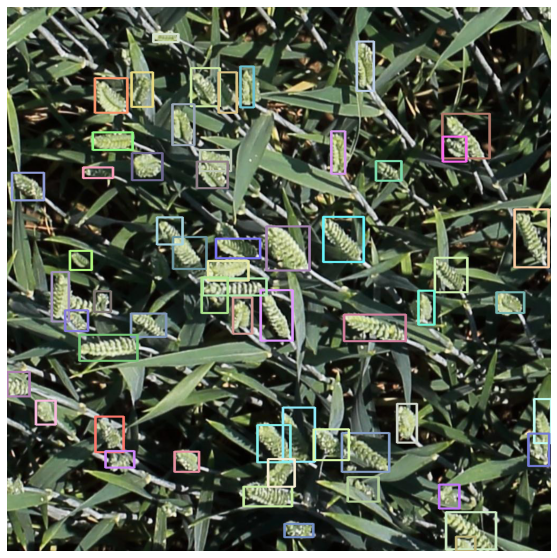

In [ ]:
show_record(train_records[0], figsize = (10,10), display_label=False )

In [ ]:
train_records[0]

BaseRecord

common: 
	- Filepath: /content/global-wheat-detection/train/46630486d.jpg
	- Img: None
	- Image size ImgSize(width=1024, height=1024)
	- Record ID: 46630486d
detection: 
	- Class Map: <ClassMap: {'background': 0, 'wheat': 1}>
	- Labels: [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
	- BBoxes: [<BBox (xmin:955.0, ymin:380.0, xmax:1019.0, ymax:490.0)>, <BBox (xmin:477.0, ymin:532.0, xmax:537.0, ymax:628.0)>, <BBox (xmin:826.0, ymin:950.0, xmax:920.0, ymax:1021.0)>, <BBox (xmin:819.0, ymin:200.0, xmax:908.0, ymax:285.0)>, <BBox (xmin:634.0, ymin:578.0, xmax:750.0, ymax:629.0)>, <BBox (xmin:595.0, ymin:394.0, xmax:671.0, ymax:480.0)>, <BBox (xmin:805.0, ymin:471.0, xmax:866.0, ymax:537.0)>, <BBox (xmin:84.0, ymin:498.0, xmax:116.0, ymax:592.0)>, <BBox (xmin:630.0, ymin:801.0, xmax:719.0, ymax:875.0)>, <BBox (xmin:165.0, ymin:133.0, xmax:226.0, ymax:19

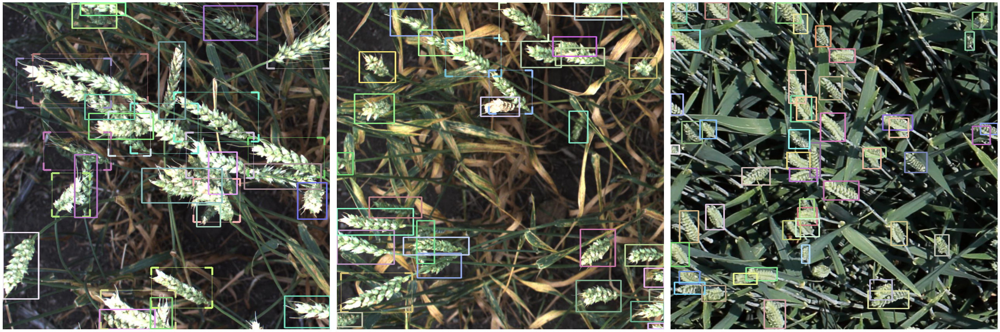

In [ ]:
show_records(train_records[1:4], ncols=3,display_label=False)

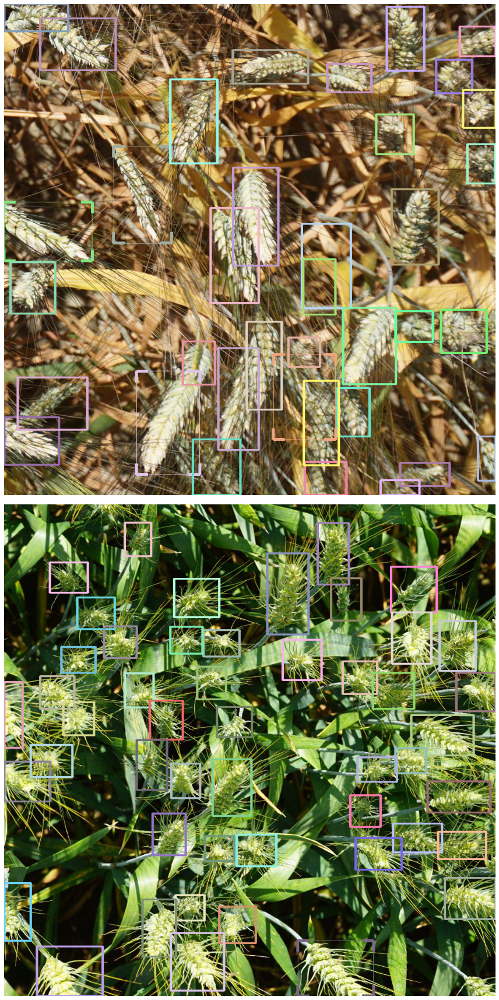

In [ ]:
show_records(train_records[5:7], display_label=False)

### Transforms

In [ ]:
presize = 512
image_size = 384

train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=image_size, presize=presize), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(size=image_size), tfms.A.Normalize()])

### Train and Validation Dataset Objects

In [ ]:
train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)

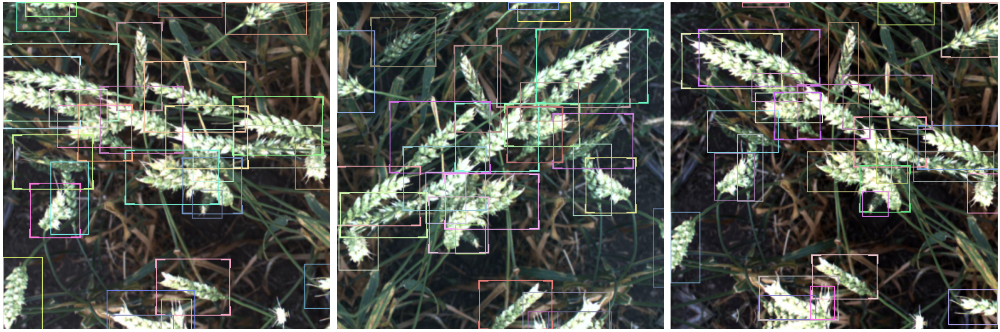

In [ ]:
samples = [train_ds[1] for _ in range(3)]
show_samples(samples, ncols=3, display_label=False)

### Model

In [ ]:
selection = 0

extra_args = {}

if selection == 0:
  model_type = models.mmdet.retinanet
  backbone = model_type.backbones.resnet50_fpn_1x

elif selection == 1:
  # The Retinanet model is also implemented in the torchvision library
  model_type = models.torchvision.retinanet
  backbone = model_type.backbones.resnet50_fpn

elif selection == 2:
  model_type = models.ross.efficientdet
  backbone = model_type.backbones.tf_lite0
  # The efficientdet model requires an img_size parameter
  extra_args['img_size'] = image_size

elif selection == 3:
  model_type = models.ultralytics.yolov5
  backbone = model_type.backbones.small
  # The yolov5 model requires an img_size parameter
  extra_args['img_size'] = image_size

In [ ]:
model = model_type.model(backbone=backbone(pretrained=True), num_classes=len(parser.class_map), **extra_args) 

### DataLoaders

In [ ]:
train_dl = model_type.train_dl(train_ds, batch_size=8, num_workers=2, shuffle=True)
valid_dl = model_type.valid_dl(valid_ds, batch_size=8, num_workers=2, shuffle=False)

model_type.show_batch(first(valid_dl), ncols=2)

### Metrics and Learner

SuggestedLRs(lr_min=0.00043651582673192023, lr_steep=0.04786301031708717)

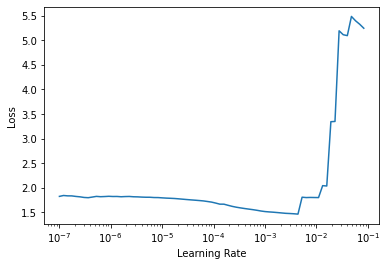

In [ ]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

learn = model_type.fastai.learner(dls=[train_dl, valid_dl], model=model, metrics=metrics)

learn.lr_find()

In [ ]:
learn.fine_tune(20, 4e-4, freeze_epochs=1)

epoch,train_loss,valid_loss,COCOMetric,time
0,0.643232,0.609152,0.236787,04:38


epoch,train_loss,valid_loss,COCOMetric,time
0,0.539485,0.512883,0.329394,04:51
1,0.524518,0.495535,0.346624,04:47
2,0.502157,0.475722,0.369555,04:49
3,0.490112,0.475499,0.365245,04:48
4,0.479012,0.464658,0.375988,04:45
5,0.471368,0.466564,0.378793,04:45
6,0.465504,0.445768,0.400851,04:43
7,0.456183,0.429268,0.409720,04:41
8,0.444008,0.426961,0.418625,04:39
9,0.430694,0.418965,0.421158,04:35


epoch,train_loss,valid_loss,COCOMetric,time
0,0.539485,0.512883,0.329394,04:51
1,0.524518,0.495535,0.346624,04:47
2,0.502157,0.475722,0.369555,04:49
3,0.490112,0.475499,0.365245,04:48
4,0.479012,0.464658,0.375988,04:45
5,0.471368,0.466564,0.378793,04:45
6,0.465504,0.445768,0.400851,04:43
7,0.456183,0.429268,0.409720,04:41
8,0.444008,0.426961,0.418625,04:39
9,0.430694,0.418965,0.421158,04:35


### Visualize Results

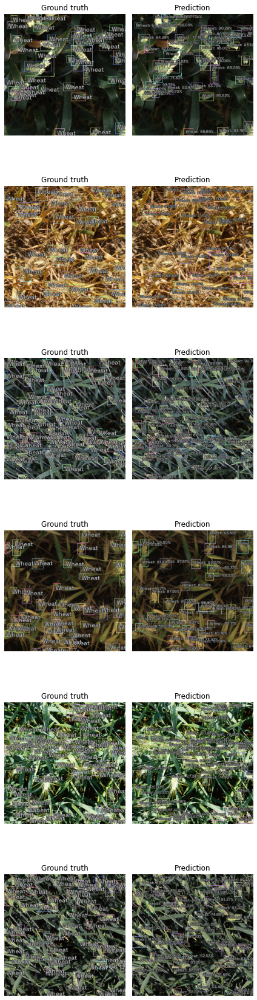

In [ ]:
model_type.show_results(model, valid_ds) 

### Save the Model

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)
root_dir = Path('/content/gdrive/My Drive/')

Mounted at /content/gdrive


In [ ]:
fname_model = 'wheat-mmdet_retinanet.pth'
torch.save(model.state_dict(), root_dir/'models'/fname_model)

## Happy Learning!

If you need any assistance, feel free to join our [forum](https://discord.gg/JDBeZYK).